In [2]:
import pickle as pkl 
import pandas as pd
from os.path import join

In [6]:
import sys
sys.path.append(r"/n/home12/binxuwang/Github/Closed-loop-visual-insilico")
from os.path import join
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from core.data_utils import load_neural_data, load_from_hdf5, load_neural_trial_resp_tensor, create_response_tensor
from core.posthoc_prediction_utils import parse_accentuated_filenames_to_df

In [53]:
subject_ids = ["red_20250428-20250430",  "paul_20250428-20250430", "leap_250426-250501", "three0_250426-250501", "venus_250426-250429"]
subject_id = "red_20250428-20250430"
posthoc_dir = f"/n/holylabs/LABS/alvarez_lab/Lab/VVS_Accentuation/Encoding_models/{subject_id}/posthoc_model_predict"
df_encoding_w_pred_resp = pd.read_pickle(join(posthoc_dir, f"encoding_stim_info_w_pred_resp_{subject_id}.pkl"))

In [54]:
df_encoding_w_pred_resp

,stimulus_name,is_nsd,is_floc,is_OO,is_train,is_normalizer,is_test,image_fps,pred_resp_AlexNet_training_seed_01_unit_0,pred_resp_AlexNet_training_seed_01_unit_15,...,pred_resp_resnet50_robust_unit_0,pred_resp_resnet50_robust_unit_15,pred_resp_resnet50_robust_unit_19,pred_resp_resnet50_robust_unit_2,pred_resp_resnet50_robust_unit_9,pred_resp_siglip2_vitb16_unit_0,pred_resp_siglip2_vitb16_unit_15,pred_resp_siglip2_vitb16_unit_19,pred_resp_siglip2_vitb16_unit_2,pred_resp_siglip2_vitb16_unit_9
0,BigAnimate_20.png,False,False,True,True,False,False,/n/holylabs/LABS/alvarez_lab/Lab/VVS_Accentuat...,-0.151740,-0.672605,...,-0.238290,-0.529224,-0.342366,-0.672722,-0.150674,-0.230840,-0.595648,-0.317637,-0.505491,-0.150998
1,BigAnimate_60.png,False,False,True,True,False,False,/n/holylabs/LABS/alvarez_lab/Lab/VVS_Accentuat...,0.090289,-0.327171,...,-0.076855,-0.432661,-0.324526,-0.177651,-0.195175,0.040841,-0.433597,-0.283307,-0.261162,-0.152137
2,FFM_022.png,False,False,True,True,False,False,/n/holylabs/LABS/alvarez_lab/Lab/VVS_Accentuat...,0.453049,0.727893,...,0.331854,0.813201,0.438944,0.143470,0.582507,0.390424,0.719016,0.510035,0.109263,0.630329
3,FFM_030.png,False,False,True,True,False,False,/n/holylabs/LABS/alvarez_lab/Lab/VVS_Accentuat...,-0.068378,0.515165,...,0.061748,0.641946,0.019931,-0.255895,0.014679,-0.053412,0.564646,-0.093356,-0.152845,-0.058448
4,FFM_037.png,False,False,True,True,False,False,/n/holylabs/LABS/alvarez_lab/Lab/VVS_Accentuat...,0.221000,0.352040,...,0.212286,0.358183,-0.155264,0.411841,0.086989,0.138923,0.527494,-0.284060,0.484491,-0.032686
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
964,toyhorse_15.png,False,False,True,True,False,False,/n/holylabs/LABS/alvarez_lab/Lab/VVS_Accentuat...,-0.101748,-0.492069,...,-0.177696,-0.505669,-0.528427,0.075982,-0.333016,-0.228496,-0.442947,-0.469842,0.062032,-0.296735
965,vase_07.png,False,False,True,True,False,False,/n/holylabs/LABS/alvarez_lab/Lab/VVS_Accentuat...,1.068220,0.104162,...,0.700098,-0.493550,0.264510,-0.506453,0.361253,0.560097,-0.558275,0.175673,-0.428007,0.297392
966,wineglass_13.png,False,False,True,True,False,False,/n/holylabs/LABS/alvarez_lab/Lab/VVS_Accentuat...,0.483790,-0.034035,...,0.365427,-0.502787,0.007602,-0.509526,-0.077331,0.119051,-0.480460,-0.039459,-0.572218,-0.130211
967,yarn_03.png,False,False,True,False,False,True,/n/holylabs/LABS/alvarez_lab/Lab/VVS_Accentuat...,0.032516,-0.009379,...,-0.429722,-0.306796,-0.392040,-0.215662,-0.344712,-0.334517,-0.250217,-0.586871,-0.270701,-0.619806


In [55]:
# Convert string boolean columns to actual boolean type
bool_columns = ['is_nsd', 'is_floc', 'is_OO', 'is_train', 'is_normalizer', 'is_test']

for col in bool_columns:
    if col in df_encoding_w_pred_resp.columns:
        if df_encoding_w_pred_resp[col].dtype == 'object':
            df_encoding_w_pred_resp[col] = df_encoding_w_pred_resp[col] == "True"


In [47]:
(df_encoding_w_pred_resp.is_train == 'False').sum()

0

In [7]:
dataroot = r"/n/holylabs/LABS/alvarez_lab/Lab/VVS_Accentuation/Ephys_Data"
data_path = join(dataroot, 'vvs-accentuate_controlsessions_5monkeys_250504-250512.h5')
data = load_from_hdf5(data_path)

In [57]:
subject_id = 'red_20250504-20250512'
# subject_id = "paul_20250505-20250512"
respmat = data[subject_id]["repavg"]['response_peak']
stimnames = data[subject_id]["repavg"]["stimulus_name"]
print("respmat.shape", respmat.shape)
print("stimnames.shape", stimnames.shape)
stimnames_str = [s.decode('utf-8') for s in stimnames]
df_allstim = parse_accentuated_filenames_to_df(stimnames_str, include_parse_fail=True)

respmat.shape (5575, 64)
stimnames.shape (5575,)


In [58]:
unit_list = df_allstim.unit_id.dropna().unique()
df_allstim_w_neural_rsp = df_allstim.copy()
for unit in unit_list:
    df_allstim_w_neural_rsp[f"neural_resp_unit_{unit}"] = respmat[:, unit]

In [59]:
df_allstim_w_neural_rsp

,model_name,unit_id,img_id,level,score,filepath,neural_resp_unit_0,neural_resp_unit_15,neural_resp_unit_19,neural_resp_unit_2,neural_resp_unit_9
0,AlexNet_training_seed_01,0,0,-0.228237,-0.221289,AlexNet_training_seed_01_RidgeCV_unit_0_img_0_...,0.431920,0.577541,3.035172,-0.023871,0.651321
1,AlexNet_training_seed_01,0,0,-1.037346,-1.027856,AlexNet_training_seed_01_RidgeCV_unit_0_img_0_...,0.398581,0.128980,0.901974,0.836844,0.723255
2,AlexNet_training_seed_01,0,0,-1.846455,-1.838532,AlexNet_training_seed_01_RidgeCV_unit_0_img_0_...,1.373433,3.106471,1.747782,0.639093,2.562169
3,AlexNet_training_seed_01,0,0,0.580873,0.572135,AlexNet_training_seed_01_RidgeCV_unit_0_img_0_...,0.567470,1.383990,5.369764,-0.143638,1.097371
4,AlexNet_training_seed_01,0,0,1.389982,1.380919,AlexNet_training_seed_01_RidgeCV_unit_0_img_0_...,0.260936,1.754026,3.460443,-0.072539,1.246995
...,...,...,...,...,...,...,...,...,...,...,...
5570,siglip2_vitb16,9,9,3.442825,3.434636,siglip2_vitb16_RidgeCV_unit_9_img_9_level_3.44...,0.549185,-0.649754,-0.206392,-0.292614,0.876949
5571,siglip2_vitb16,9,9,4.184206,4.18034,siglip2_vitb16_RidgeCV_unit_9_img_9_level_4.18...,1.054193,-0.487268,-0.099224,-0.217041,0.449348
5572,siglip2_vitb16,9,9,4.925587,4.921776,siglip2_vitb16_RidgeCV_unit_9_img_9_level_4.92...,-0.582650,-0.295747,-0.890730,-0.673369,-0.821746
5573,siglip2_vitb16,9,9,5.666968,5.657128,siglip2_vitb16_RidgeCV_unit_9_img_9_level_5.66...,-0.861819,-0.032162,0.236117,-0.510662,-0.055597


In [60]:
df_natimg_w_neural_rsp = df_allstim_w_neural_rsp.query("model_name.isna()")
df_natimg_w_neural_rsp = df_natimg_w_neural_rsp.drop(columns=['model_name', 'unit_id', 'img_id', 'level', 'score'])

In [61]:
df_natimg_w_neural_rsp

,filepath,neural_resp_unit_0,neural_resp_unit_15,neural_resp_unit_19,neural_resp_unit_2,neural_resp_unit_9
546,FFM_119.png,0.148070,0.711617,0.094558,1.013245,0.663447
547,FH_148.png,-0.254753,1.568507,-0.248642,0.569861,0.267570
548,FH_181.png,1.311378,2.605409,1.026851,-0.053576,1.877442
549,FH_219.png,-0.146456,3.109067,-0.154859,0.419178,0.443306
550,FH_226.png,5.138379,4.219829,3.595835,-0.218638,5.259384
...,...,...,...,...,...,...
5023,shared0934_nsd67743.png,0.445123,0.350200,0.301542,-0.145756,0.713468
5024,shared0940_nsd68312.png,-0.072270,0.237377,-0.369267,-0.398229,-0.168178
5025,shared0968_nsd70194.png,0.245177,0.925741,-0.300647,0.260764,0.136593
5026,shared0998_nsd72606.png,-0.468078,-0.592207,-0.804196,-0.404909,-0.576689


In [62]:
df_natimg_neural_pred = df_natimg_w_neural_rsp.merge(df_encoding_w_pred_resp, left_on='filepath', right_on='stimulus_name', how='left')

In [63]:
df_natimg_neural_pred

,filepath,neural_resp_unit_0,neural_resp_unit_15,neural_resp_unit_19,neural_resp_unit_2,neural_resp_unit_9,stimulus_name,is_nsd,is_floc,is_OO,...,pred_resp_resnet50_robust_unit_0,pred_resp_resnet50_robust_unit_15,pred_resp_resnet50_robust_unit_19,pred_resp_resnet50_robust_unit_2,pred_resp_resnet50_robust_unit_9,pred_resp_siglip2_vitb16_unit_0,pred_resp_siglip2_vitb16_unit_15,pred_resp_siglip2_vitb16_unit_19,pred_resp_siglip2_vitb16_unit_2,pred_resp_siglip2_vitb16_unit_9
0,FFM_119.png,0.148070,0.711617,0.094558,1.013245,0.663447,FFM_119.png,False,False,True,...,-0.042399,0.376466,0.032345,0.397198,0.085758,-0.118549,0.345718,0.000321,0.335533,0.061999
1,FH_148.png,-0.254753,1.568507,-0.248642,0.569861,0.267570,FH_148.png,False,False,True,...,0.197866,0.768324,0.078088,0.481381,0.290228,0.112273,1.094218,0.075358,0.311867,0.360632
2,FH_181.png,1.311378,2.605409,1.026851,-0.053576,1.877442,FH_181.png,False,False,True,...,0.813520,0.683299,0.658772,0.708489,1.134469,1.840859,1.260378,1.627213,1.003707,2.089359
3,FH_219.png,-0.146456,3.109067,-0.154859,0.419178,0.443306,FH_219.png,False,False,True,...,0.134116,2.229799,-0.074492,0.426779,0.383144,-0.008517,2.428303,-0.137647,0.406842,0.324738
4,FH_226.png,5.138379,4.219829,3.595835,-0.218638,5.259384,FH_226.png,False,False,True,...,2.365682,2.137363,2.261666,0.066455,2.764836,2.634869,2.282684,2.278650,0.162379,2.893975
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,shared0934_nsd67743.png,0.445123,0.350200,0.301542,-0.145756,0.713468,shared0934_nsd67743.png,True,False,False,...,0.774862,0.565059,0.759908,1.325189,0.588232,0.033293,0.140401,0.145394,0.778138,0.061406
96,shared0940_nsd68312.png,-0.072270,0.237377,-0.369267,-0.398229,-0.168178,shared0940_nsd68312.png,True,False,False,...,0.307060,0.333852,-0.047081,0.113325,-0.061528,-0.087165,-0.054316,0.029104,0.044719,0.039929
97,shared0968_nsd70194.png,0.245177,0.925741,-0.300647,0.260764,0.136593,shared0968_nsd70194.png,True,False,False,...,0.131851,0.486378,0.273780,1.073357,0.260224,0.155770,0.530142,0.177394,0.879394,0.198146
98,shared0998_nsd72606.png,-0.468078,-0.592207,-0.804196,-0.404909,-0.576689,shared0998_nsd72606.png,True,False,False,...,-0.421312,-0.748704,-0.298905,-0.274826,-0.102357,-0.409150,-0.765045,-0.256893,-0.303167,-0.057417


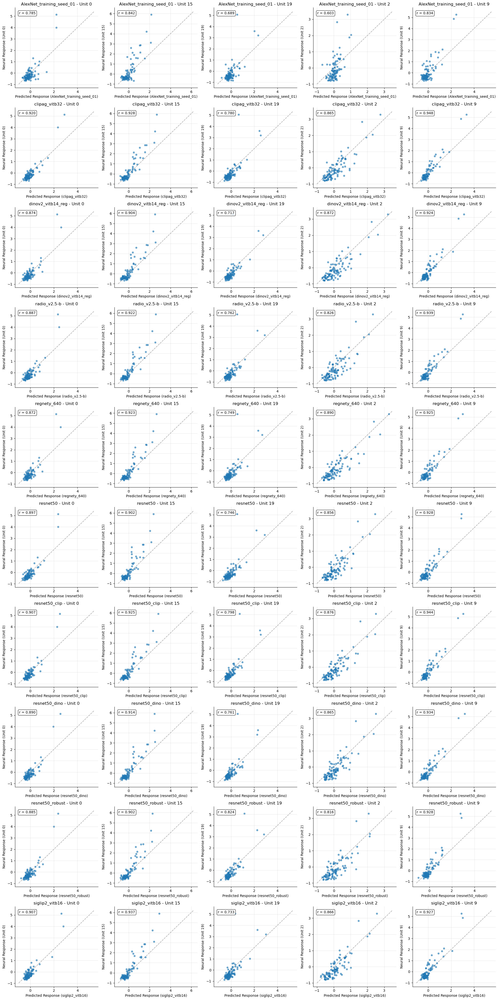

In [64]:
import matplotlib.pyplot as plt
import numpy as np

# Get unique models from the prediction columns
pred_cols = [col for col in df_natimg_neural_pred.columns if col.startswith('pred_resp_')]
models = list(set([col.split('_unit_')[0].replace('pred_resp_', '') for col in pred_cols]))
models.sort()

# Create subplots
fig, axes = plt.subplots(len(models), len(unit_list), figsize=(4*len(unit_list), 4*len(models)))
if len(models) == 1:
    axes = axes.reshape(1, -1)
if len(unit_list) == 1:
    axes = axes.reshape(-1, 1)

for i, model in enumerate(models):
    for j, unit in enumerate(unit_list):
        ax = axes[i, j]
        
        # Get the prediction and neural response columns
        pred_col = f'pred_resp_{model}_unit_{unit}'
        neural_col = f'neural_resp_unit_{unit}'
        
        if pred_col in df_natimg_neural_pred.columns:
            # Remove NaN values
            mask = ~(df_natimg_neural_pred[pred_col].isna() | df_natimg_neural_pred[neural_col].isna())
            x = df_natimg_neural_pred.loc[mask, pred_col]
            y = df_natimg_neural_pred.loc[mask, neural_col]
            
            # Scatter plot
            ax.scatter(x, y, alpha=0.6, s=20)
            
            # Calculate and display correlation
            if len(x) > 1:
                corr = np.corrcoef(x, y)[0, 1]
                ax.text(0.05, 0.95, f'r = {corr:.3f}', transform=ax.transAxes, 
                       verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
            
            # Add diagonal line for reference
            lims = [
                np.min([ax.get_xlim(), ax.get_ylim()]),
                np.max([ax.get_xlim(), ax.get_ylim()]),
            ]
            ax.plot(lims, lims, 'k--', alpha=0.3, zorder=0)
        
        # Labels and title
        ax.set_xlabel(f'Predicted Response ({model})')
        ax.set_ylabel(f'Neural Response (Unit {unit})')
        ax.set_title(f'{model} - Unit {unit}')
        ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


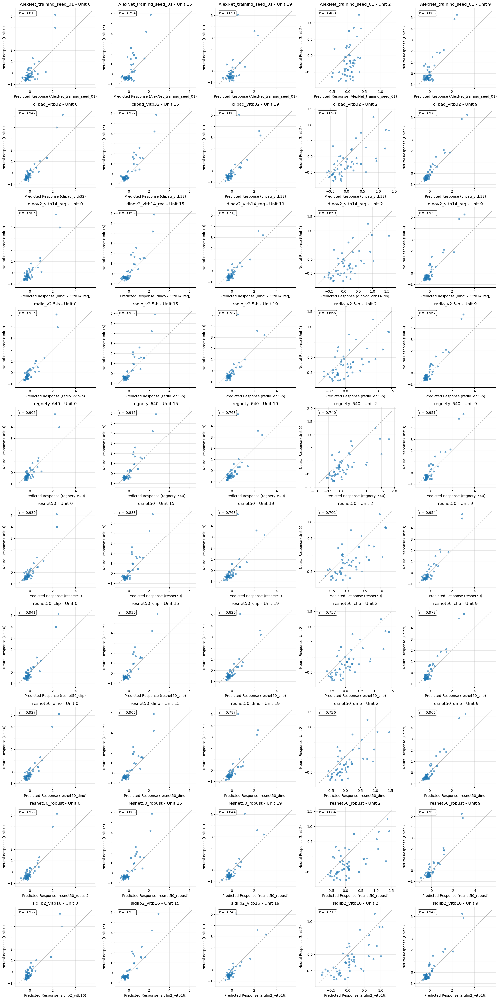

In [71]:
import matplotlib.pyplot as plt
import numpy as np

# Get unique models from the prediction columns
pred_cols = [col for col in df_natimg_neural_pred.columns if col.startswith('pred_resp_')]
models = list(set([col.split('_unit_')[0].replace('pred_resp_', '') for col in pred_cols]))
models.sort()

# Create subplots
fig, axes = plt.subplots(len(models), len(unit_list), figsize=(4*len(unit_list), 4*len(models)))
if len(models) == 1:
    axes = axes.reshape(1, -1)
if len(unit_list) == 1:
    axes = axes.reshape(-1, 1)

for i, model in enumerate(models):
    for j, unit in enumerate(unit_list):
        ax = axes[i, j]
        
        # Get the prediction and neural response columns
        pred_col = f'pred_resp_{model}_unit_{unit}'
        neural_col = f'neural_resp_unit_{unit}'
        
        if pred_col in df_natimg_neural_pred.columns:
            # Remove NaN values
            mask = ~(df_natimg_neural_pred[pred_col].isna() | df_natimg_neural_pred[neural_col].isna()) & ~df_natimg_neural_pred.is_train
            x = df_natimg_neural_pred.loc[mask, pred_col]
            y = df_natimg_neural_pred.loc[mask, neural_col]
            
            # Scatter plot
            ax.scatter(x, y, alpha=0.6, s=20)
            
            # Calculate and display correlation
            if len(x) > 1:
                corr = np.corrcoef(x, y)[0, 1]
                ax.text(0.05, 0.95, f'r = {corr:.3f}', transform=ax.transAxes, 
                       verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
            
            # Add diagonal line for reference
            lims = [
                np.min([ax.get_xlim(), ax.get_ylim()]),
                np.max([ax.get_xlim(), ax.get_ylim()]),
            ]
            ax.plot(lims, lims, 'k--', alpha=0.3, zorder=0)
        
        # Labels and title
        ax.set_xlabel(f'Predicted Response ({model})')
        ax.set_ylabel(f'Neural Response (Unit {unit})')
        ax.set_title(f'{model} - Unit {unit}')
        ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


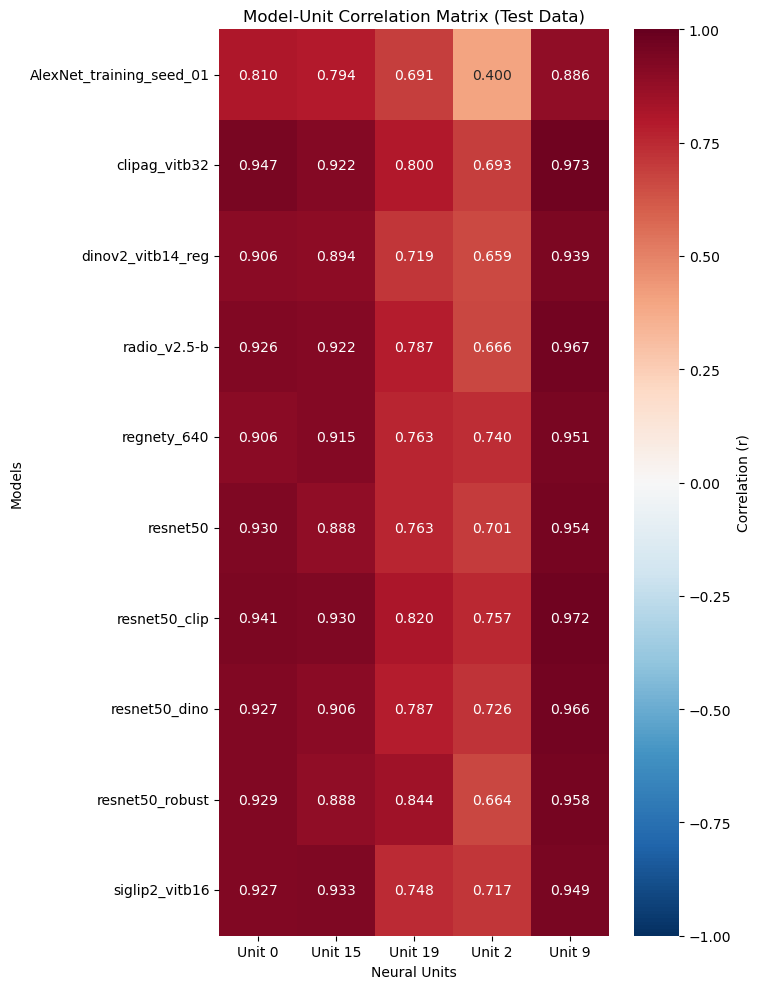

In [77]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Get unique models from the prediction columns
pred_cols = [col for col in df_natimg_neural_pred.columns if col.startswith('pred_resp_')]
models = list(set([col.split('_unit_')[0].replace('pred_resp_', '') for col in pred_cols]))
models.sort()

# Create correlation matrix
corr_matrix = np.full((len(models), len(unit_list)), np.nan)

for i, model in enumerate(models):
    for j, unit in enumerate(unit_list):
        # Get the prediction and neural response columns
        pred_col = f'pred_resp_{model}_unit_{unit}'
        neural_col = f'neural_resp_unit_{unit}'
        
        if pred_col in df_natimg_neural_pred.columns:
            # Remove NaN values and use test data only
            mask = ~(df_natimg_neural_pred[pred_col].isna() | df_natimg_neural_pred[neural_col].isna()) & ~df_natimg_neural_pred.is_train
            x = df_natimg_neural_pred.loc[mask, pred_col]
            y = df_natimg_neural_pred.loc[mask, neural_col]
            
            # Calculate correlation
            if len(x) > 1:
                corr = np.corrcoef(x, y)[0, 1]
                corr_matrix[i, j] = corr

# Create heatmap using seaborn
fig, ax = plt.subplots(figsize=(len(unit_list)*1.5, len(models)*1.))
sns.heatmap(corr_matrix, 
            annot=True, 
            fmt='.3f',
            cmap='RdBu_r', 
            center=0,
            vmin=-1, 
            vmax=1,
            xticklabels=[f'Unit {unit}' for unit in unit_list],
            yticklabels=models,
            cbar_kws={'label': 'Correlation (r)'},
            ax=ax)

ax.set_title('Model-Unit Correlation Matrix (Test Data)')
ax.set_xlabel('Neural Units')
ax.set_ylabel('Models')

plt.tight_layout()
plt.show()


/tmp/ipykernel_183261/3660940118.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(data=df_model_corr, x='model', y='avg_correlation',


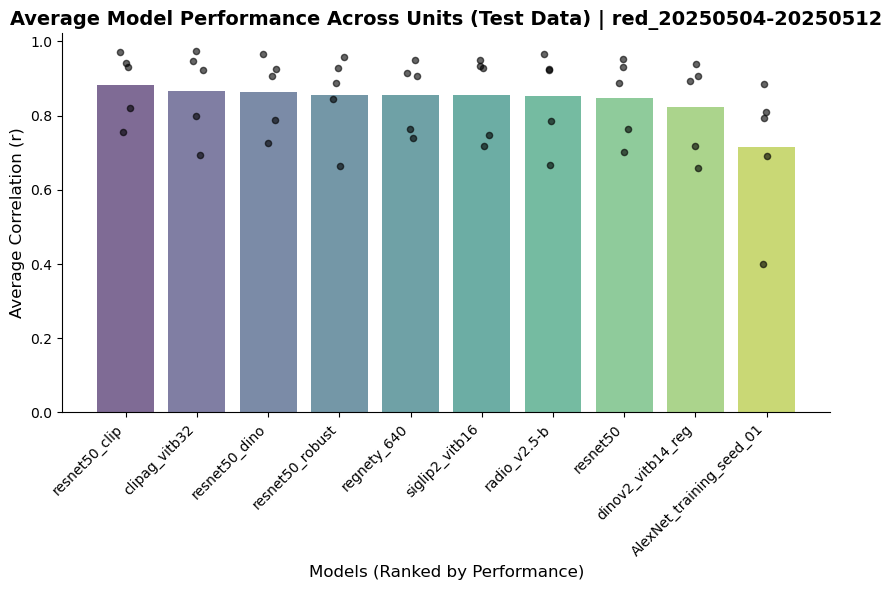

Model Rankings (High to Low):
10. resnet50_clip: 0.884
9. clipag_vitb32: 0.867
8. resnet50_dino: 0.862
7. resnet50_robust: 0.857
6. regnety_640: 0.855
5. siglip2_vitb16: 0.855
4. radio_v2.5-b: 0.854
3. resnet50: 0.847
2. dinov2_vitb14_reg: 0.823
1. AlexNet_training_seed_01: 0.716


In [81]:

# Create bar plot showing average correlation across units and seeds
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Calculate average correlation for each model
model_avg_corr = []
for i, model in enumerate(models):
    # Get all non-NaN correlations for this model
    model_corrs = corr_matrix[i, :]
    valid_corrs = model_corrs[~np.isnan(model_corrs)]
    if len(valid_corrs) > 0:
        avg_corr = np.mean(valid_corrs)
        model_avg_corr.append({'model': model, 'avg_correlation': avg_corr})

# Convert to DataFrame and sort by correlation (high to low)
df_model_corr = pd.DataFrame(model_avg_corr)
df_model_corr = df_model_corr.sort_values('avg_correlation', ascending=False)

# Create bar plot with dots
fig, ax = plt.subplots(figsize=(8.5, 6))

# Create bar plot
bars = sns.barplot(data=df_model_corr, x='model', y='avg_correlation', 
                   palette='viridis', alpha=0.7, ax=ax)

# Add individual correlation values as dots
for i, model in enumerate(df_model_corr['model']):
    model_idx = models.index(model)
    model_corrs = corr_matrix[model_idx, :]
    valid_corrs = model_corrs[~np.isnan(model_corrs)]
    
    # Add jitter to x-coordinates for better visibility
    x_jitter = np.random.normal(i, 0.05, len(valid_corrs))
    ax.scatter(x_jitter, valid_corrs, color='black', alpha=0.6, s=20, zorder=3)

ax.set_title(f'Average Model Performance Across Units (Test Data) | {subject_id}', fontsize=14, fontweight='bold')
ax.set_xlabel('Models (Ranked by Performance)', fontsize=12)
ax.set_ylabel('Average Correlation (r)', fontsize=12)
ax.set_ylim(0, None)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Print ranking
print("Model Rankings (High to Low):")
for i, row in df_model_corr.iterrows():
    print(f"{len(df_model_corr) - list(df_model_corr.index).index(i)}. {row['model']}: {row['avg_correlation']:.3f}")


### All monkeys

In [82]:
dataroot = r"/n/holylabs/LABS/alvarez_lab/Lab/VVS_Accentuation/Ephys_Data"
data_path = join(dataroot, 'vvs-accentuate_controlsessions_5monkeys_250504-250512.h5')
data = load_from_hdf5(data_path)

In [88]:
# Convert string boolean columns to actual boolean type
def convert_string_bools_to_bool(df, bool_columns=None):
    """Convert string boolean columns to actual boolean type."""
    if bool_columns is None:
        bool_columns = ['is_nsd', 'is_floc', 'is_OO', 'is_train', 'is_normalizer', 'is_test']
    
    for col in bool_columns:
        if col in df.columns:
            if df[col].dtype == 'object':
                df[col] = df[col] == "True"
    return df


In [97]:
def analyze_model_performance(df_natimg_neural_pred, unit_list, subject_id=None, subset_mask=None, title_str=""):
    """
    Analyze model performance with scatter plots, correlation heatmap, and ranking bar plot.
    
    Parameters:
    - df_natimg_neural_pred: DataFrame with neural and predicted responses
    - unit_list: List of unit IDs to analyze
    - subject_id: Subject identifier for plot titles
    - subset_mask: Boolean mask to subset the data (if None, uses all non-training data)
    """
    import matplotlib.pyplot as plt
    import numpy as np
    import seaborn as sns
    import pandas as pd
    
    # Apply subset mask if provided
    if subset_mask is None:
        df_subset = df_natimg_neural_pred
    else:
        df_subset = df_natimg_neural_pred[subset_mask]
    
    # Get unique models from the prediction columns
    pred_cols = [col for col in df_subset.columns if col.startswith('pred_resp_')]
    models = list(set([col.split('_unit_')[0].replace('pred_resp_', '') for col in pred_cols]))
    models.sort()
    
    # 1. Scatter plots
    fig1, axes = plt.subplots(len(models), len(unit_list), figsize=(4*len(unit_list), 4*len(models)))
    if len(models) == 1:
        axes = axes.reshape(1, -1)
    if len(unit_list) == 1:
        axes = axes.reshape(-1, 1)

    for i, model in enumerate(models):
        for j, unit in enumerate(unit_list):
            ax = axes[i, j]
            
            # Get the prediction and neural response columns
            pred_col = f'pred_resp_{model}_unit_{unit}'
            neural_col = f'neural_resp_unit_{unit}'
            
            if pred_col in df_subset.columns:
                # Remove NaN values
                mask = ~(df_subset[pred_col].isna() | df_subset[neural_col].isna())
                x = df_subset.loc[mask, pred_col]
                y = df_subset.loc[mask, neural_col]
                
                # Scatter plot
                ax.scatter(x, y, alpha=0.6, s=20)
                
                # Calculate and display correlation
                if len(x) > 1:
                    corr = np.corrcoef(x, y)[0, 1]
                    ax.text(0.05, 0.95, f'r = {corr:.3f}', transform=ax.transAxes, 
                           verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
                
                # Add diagonal line for reference
                lims = [
                    np.min([ax.get_xlim(), ax.get_ylim()]),
                    np.max([ax.get_xlim(), ax.get_ylim()]),
                ]
                ax.plot(lims, lims, 'k--', alpha=0.3, zorder=0)
            
            # Labels and title
            ax.set_xlabel(f'Predicted Response ({model})')
            ax.set_ylabel(f'Neural Response (Unit {unit})')
            ax.set_title(f'{model} - Unit {unit}')
            ax.grid(True, alpha=0.3)

    plt.suptitle(f"{subject_id} | {title_str}")
    plt.tight_layout()
    plt.show()

    # 2. Correlation heatmap
    # Create correlation matrix
    corr_matrix = np.full((len(models), len(unit_list)), np.nan)

    for i, model in enumerate(models):
        for j, unit in enumerate(unit_list):
            # Get the prediction and neural response columns
            pred_col = f'pred_resp_{model}_unit_{unit}'
            neural_col = f'neural_resp_unit_{unit}'
            
            if pred_col in df_subset.columns:
                # Remove NaN values
                mask = ~(df_subset[pred_col].isna() | df_subset[neural_col].isna())
                x = df_subset.loc[mask, pred_col]
                y = df_subset.loc[mask, neural_col]
                
                # Calculate correlation
                if len(x) > 1:
                    corr = np.corrcoef(x, y)[0, 1]
                    corr_matrix[i, j] = corr

    # Create heatmap using seaborn
    fig2, ax = plt.subplots(figsize=(len(unit_list)*1.5, len(models)*1.))
    sns.heatmap(corr_matrix, 
                annot=True, 
                fmt='.3f',
                cmap='RdBu_r', 
                center=0,
                vmin=-1, 
                vmax=1,
                xticklabels=[f'Unit {unit}' for unit in unit_list],
                yticklabels=models,
                cbar_kws={'label': 'Correlation (r)'},
                ax=ax)

    title_suffix = f" | {subject_id}" if subject_id else ""
    ax.set_title(f'Model-Unit Correlation Matrix{title_suffix} | {title_str}")')
    ax.set_xlabel('Neural Units')
    ax.set_ylabel('Models')

    plt.tight_layout()
    plt.show()

    # 3. Bar plot with ranking
    # Calculate average correlation for each model
    model_avg_corr = []
    for i, model in enumerate(models):
        # Get all non-NaN correlations for this model
        model_corrs = corr_matrix[i, :]
        valid_corrs = model_corrs[~np.isnan(model_corrs)]
        if len(valid_corrs) > 0:
            avg_corr = np.mean(valid_corrs)
            model_avg_corr.append({'model': model, 'avg_correlation': avg_corr})

    # Convert to DataFrame and sort by correlation (high to low)
    df_model_corr = pd.DataFrame(model_avg_corr)
    df_model_corr = df_model_corr.sort_values('avg_correlation', ascending=False)

    # Create bar plot with dots
    fig3, ax = plt.subplots(figsize=(8.5, 6))

    # Create bar plot
    bars = sns.barplot(data=df_model_corr, x='model', y='avg_correlation', 
                       palette='viridis', alpha=0.7, ax=ax)

    # Add individual correlation values as dots
    for i, model in enumerate(df_model_corr['model']):
        model_idx = models.index(model)
        model_corrs = corr_matrix[model_idx, :]
        valid_corrs = model_corrs[~np.isnan(model_corrs)]
        
        # Add jitter to x-coordinates for better visibility
        x_jitter = np.random.normal(i, 0.05, len(valid_corrs))
        ax.scatter(x_jitter, valid_corrs, color='black', alpha=0.6, s=20, zorder=3)

    title_suffix = f" | {subject_id}" if subject_id else ""
    ax.set_title(f'Average Model Performance Across Units{title_suffix}', fontsize=14, fontweight='bold')
    ax.set_xlabel('Models (Ranked by Performance)', fontsize=12)
    ax.set_ylabel('Average Correlation (r)', fontsize=12)
    ax.set_ylim(0, None)

    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    # Print ranking
    print("Model Rankings (High to Low):")
    for i, row in df_model_corr.iterrows():
        print(f"{len(df_model_corr) - list(df_model_corr.index).index(i)}. {row['model']}: {row['avg_correlation']:.3f}")
    
    return df_model_corr, corr_matrix, (fig1, fig2, fig3)


respmat.shape (5575, 64)
stimnames.shape (5575,)
paired neural DNN resp df (100, 64)


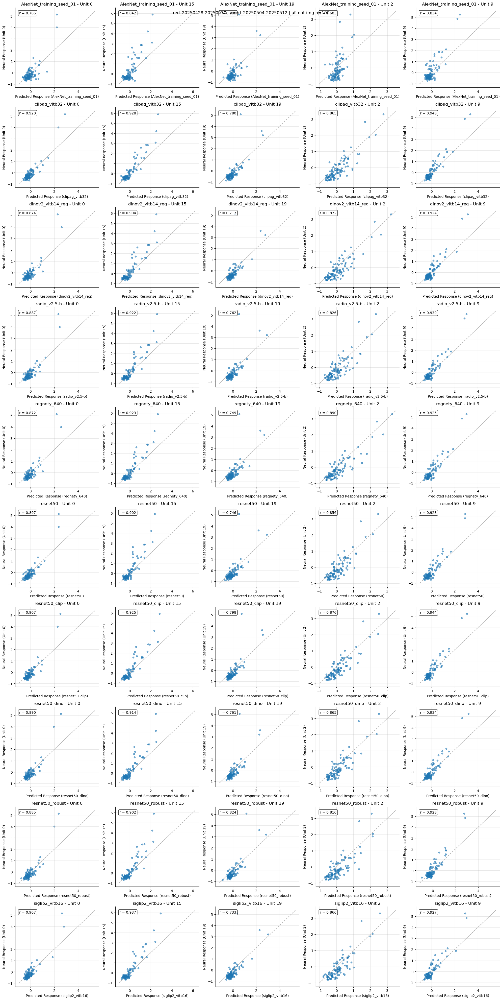

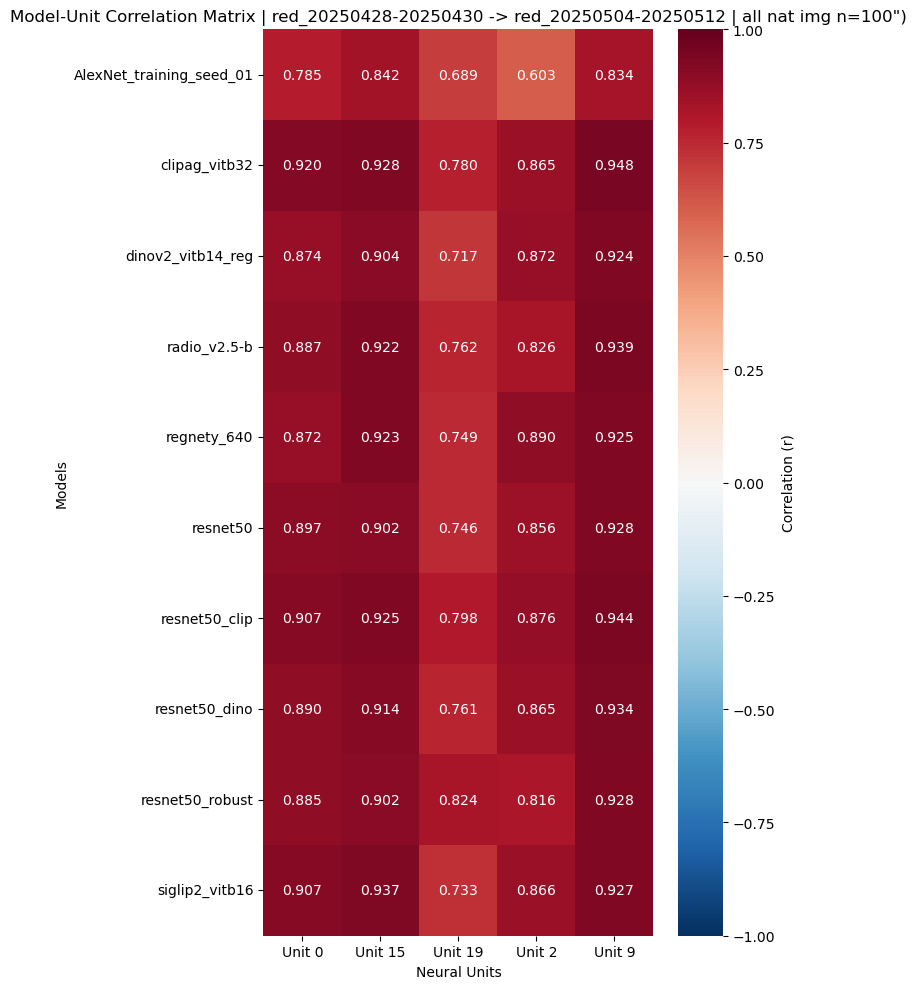

/tmp/ipykernel_183261/3203263593.py:136: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(data=df_model_corr, x='model', y='avg_correlation',


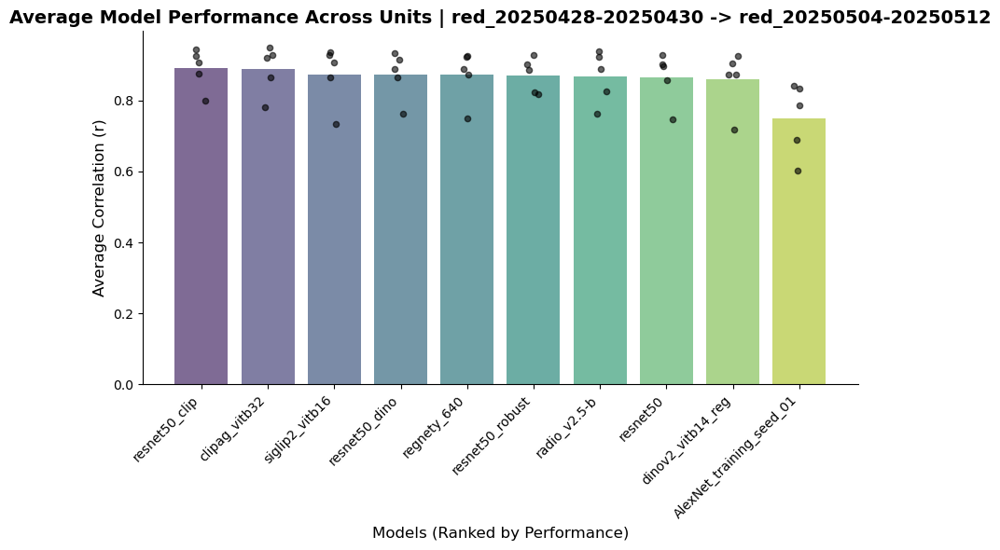

Model Rankings (High to Low):
10. resnet50_clip: 0.890
9. clipag_vitb32: 0.888
8. siglip2_vitb16: 0.874
7. resnet50_dino: 0.873
6. regnety_640: 0.872
5. resnet50_robust: 0.871
4. radio_v2.5-b: 0.867
3. resnet50: 0.866
2. dinov2_vitb14_reg: 0.858
1. AlexNet_training_seed_01: 0.751


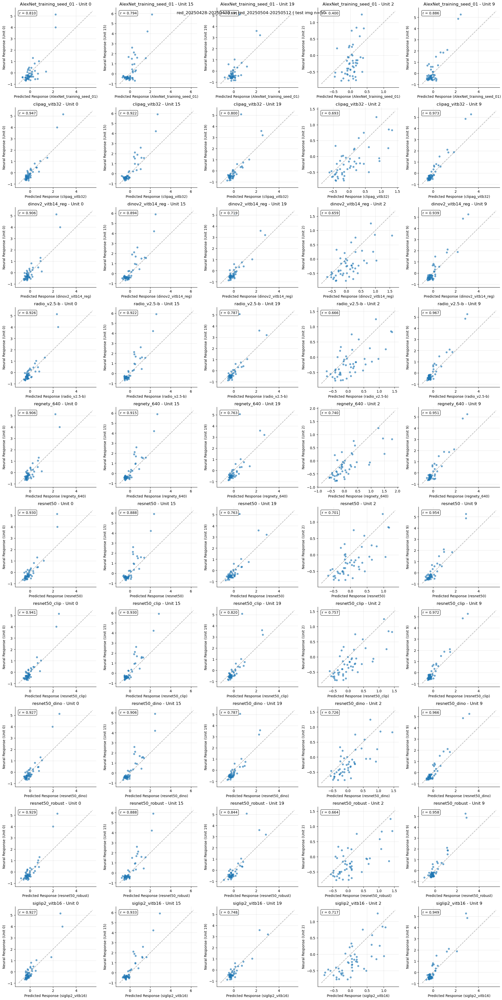

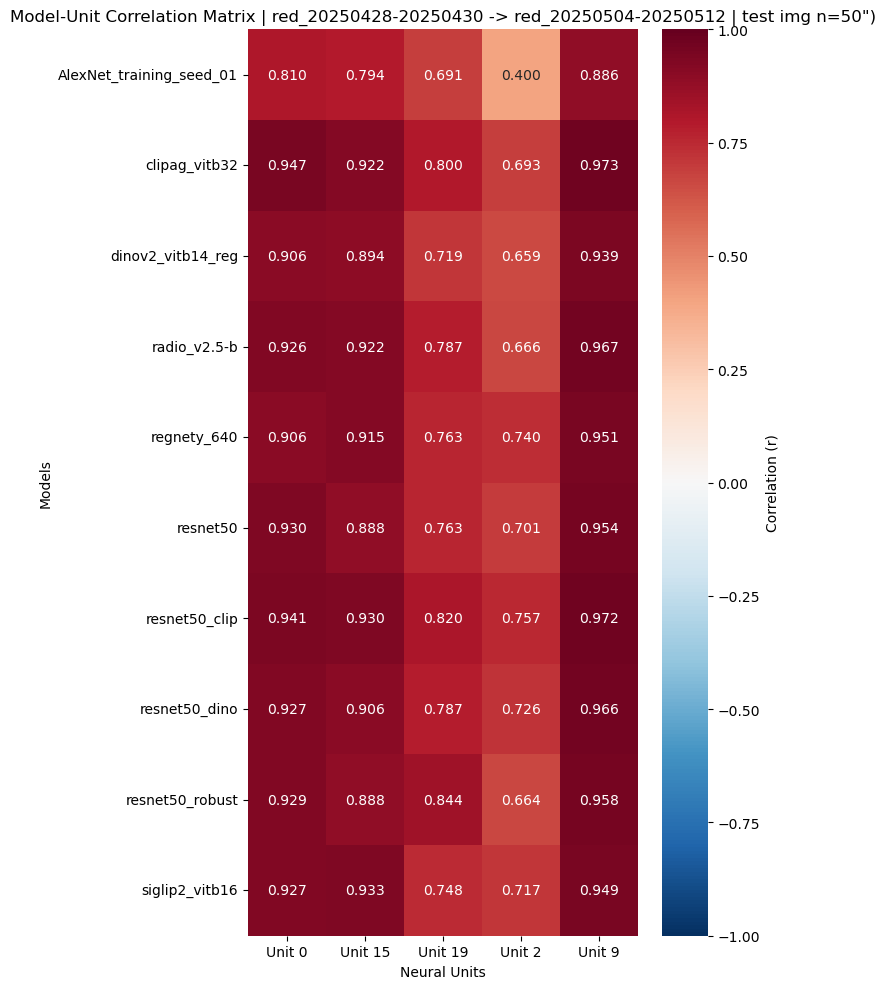

/tmp/ipykernel_183261/3203263593.py:136: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(data=df_model_corr, x='model', y='avg_correlation',


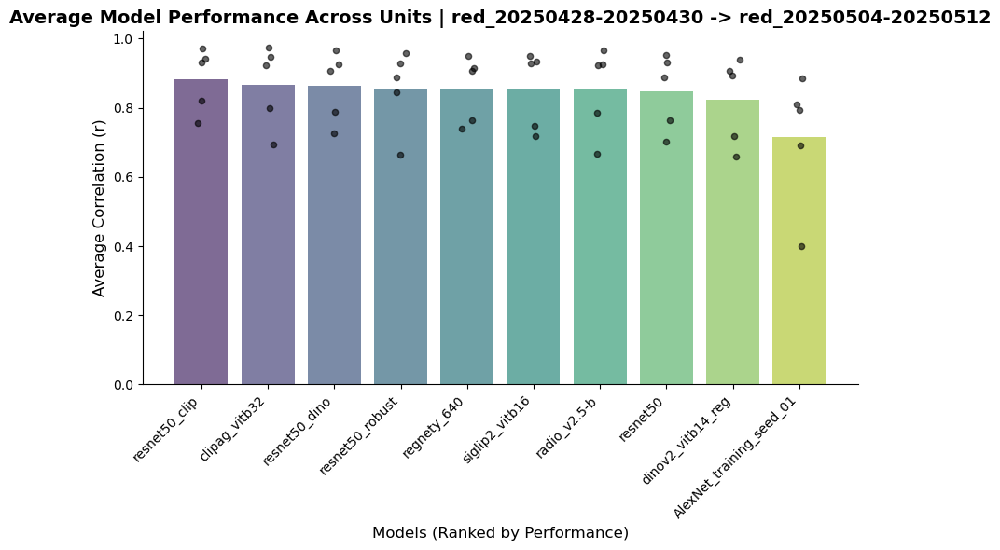

Model Rankings (High to Low):
10. resnet50_clip: 0.884
9. clipag_vitb32: 0.867
8. resnet50_dino: 0.862
7. resnet50_robust: 0.857
6. regnety_640: 0.855
5. siglip2_vitb16: 0.855
4. radio_v2.5-b: 0.854
3. resnet50: 0.847
2. dinov2_vitb14_reg: 0.823
1. AlexNet_training_seed_01: 0.716
respmat.shape (5182, 64)
stimnames.shape (5182,)
paired neural DNN resp df (100, 64)


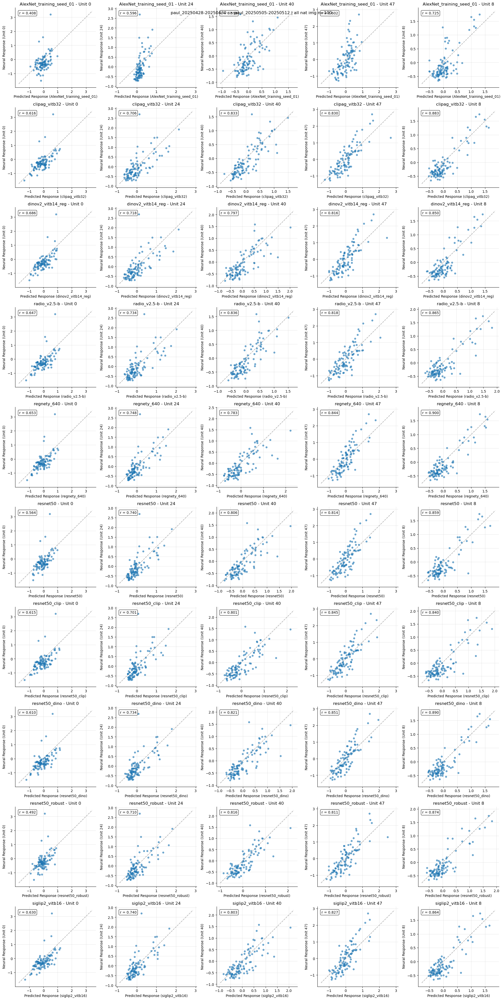

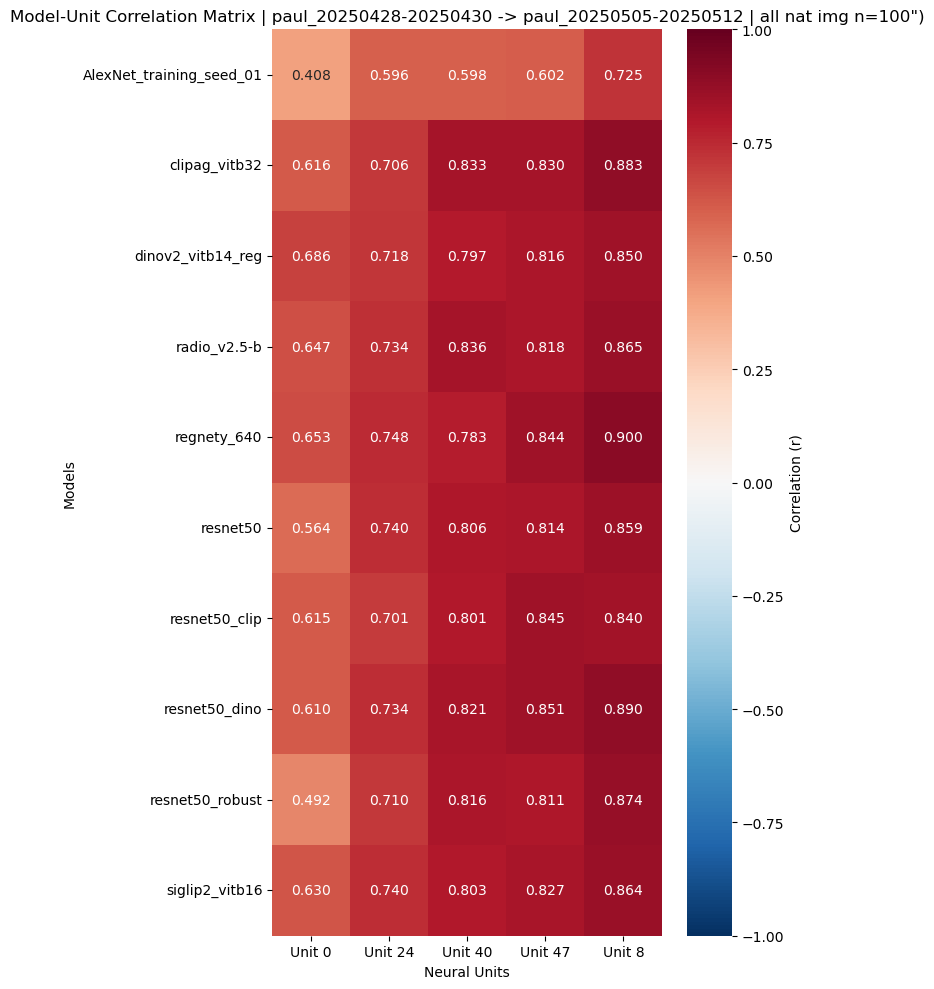

/tmp/ipykernel_183261/3203263593.py:136: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(data=df_model_corr, x='model', y='avg_correlation',


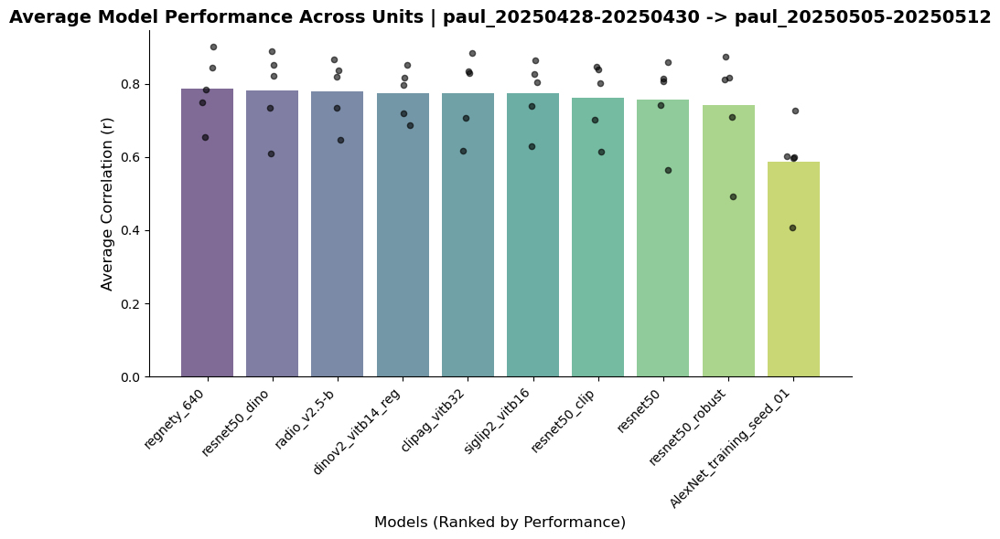

Model Rankings (High to Low):
10. regnety_640: 0.786
9. resnet50_dino: 0.781
8. radio_v2.5-b: 0.780
7. dinov2_vitb14_reg: 0.773
6. clipag_vitb32: 0.773
5. siglip2_vitb16: 0.773
4. resnet50_clip: 0.760
3. resnet50: 0.757
2. resnet50_robust: 0.741
1. AlexNet_training_seed_01: 0.586


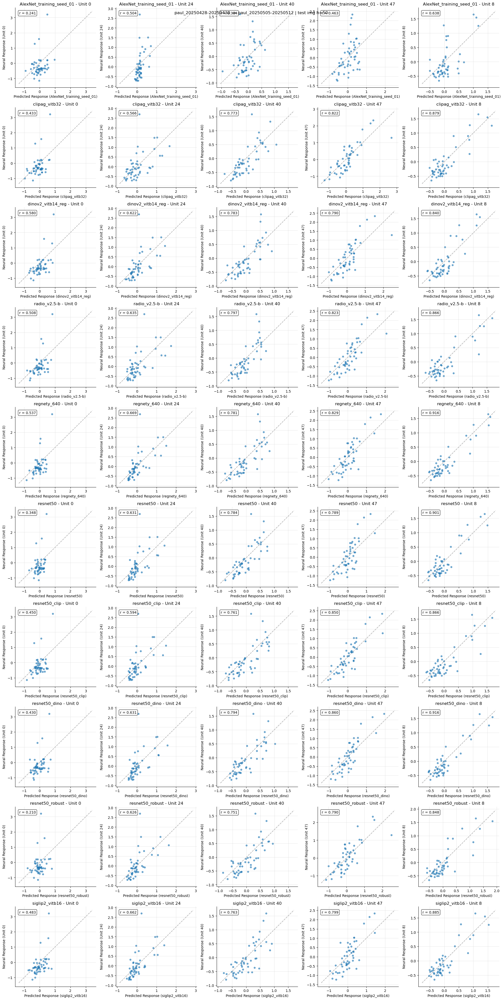

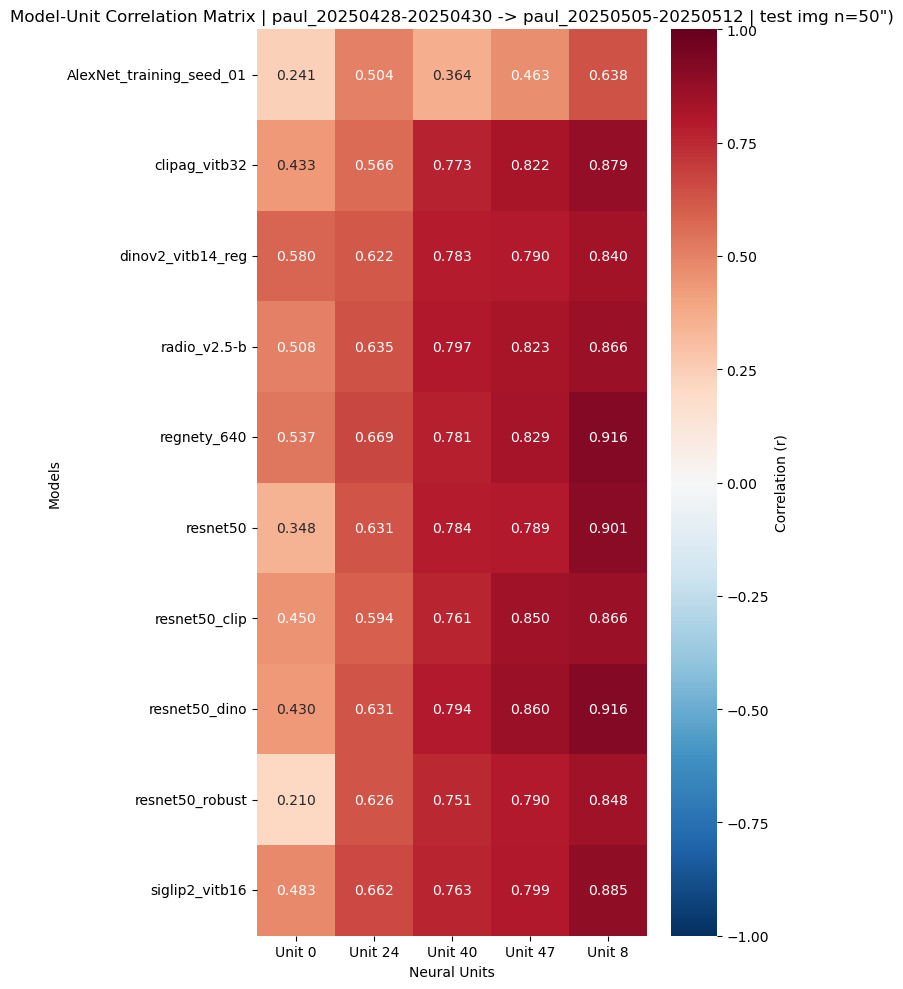

/tmp/ipykernel_183261/3203263593.py:136: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(data=df_model_corr, x='model', y='avg_correlation',


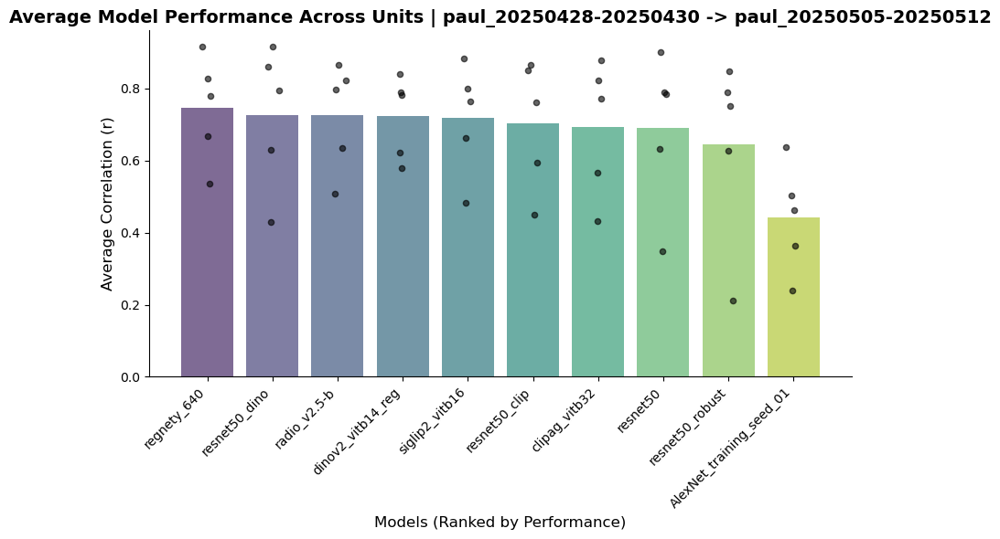

Model Rankings (High to Low):
10. regnety_640: 0.746
9. resnet50_dino: 0.726
8. radio_v2.5-b: 0.726
7. dinov2_vitb14_reg: 0.723
6. siglip2_vitb16: 0.718
5. resnet50_clip: 0.704
4. clipag_vitb32: 0.694
3. resnet50: 0.691
2. resnet50_robust: 0.645
1. AlexNet_training_seed_01: 0.442
respmat.shape (2498, 383)
stimnames.shape (2498,)
paired neural DNN resp df (49, 64)


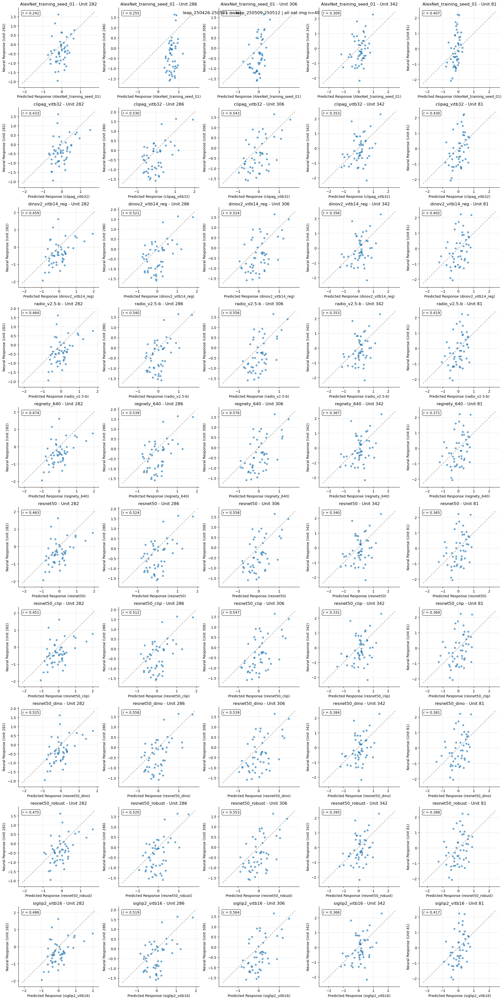

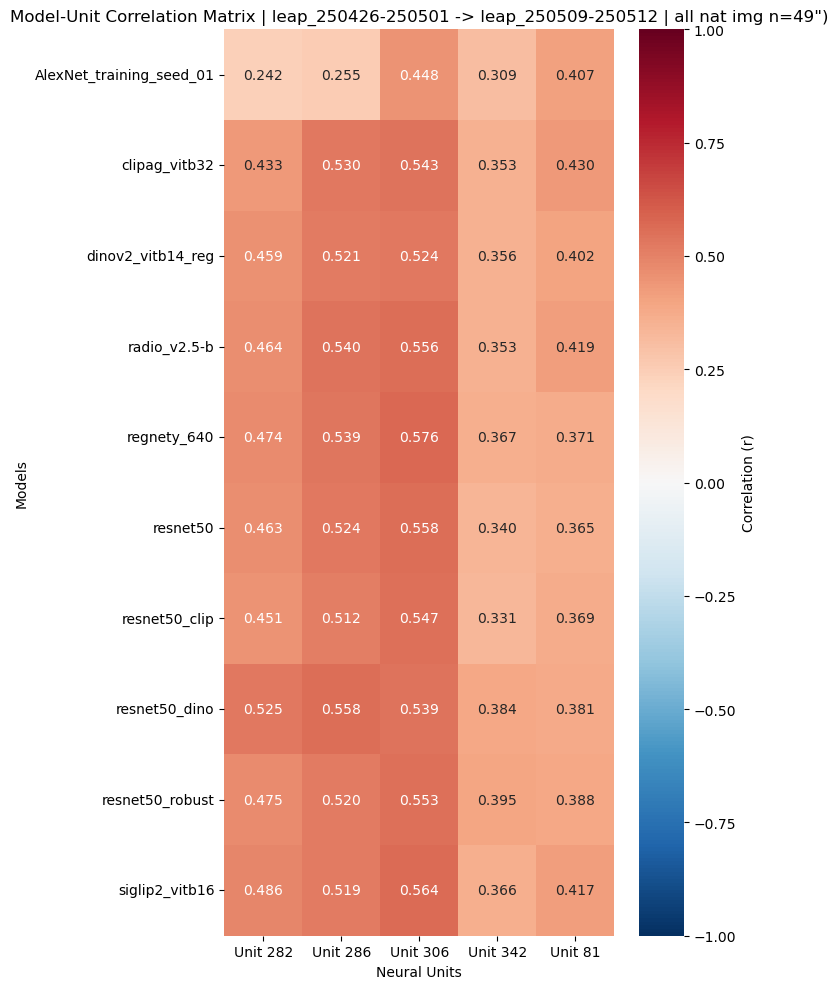

/tmp/ipykernel_183261/3203263593.py:136: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(data=df_model_corr, x='model', y='avg_correlation',


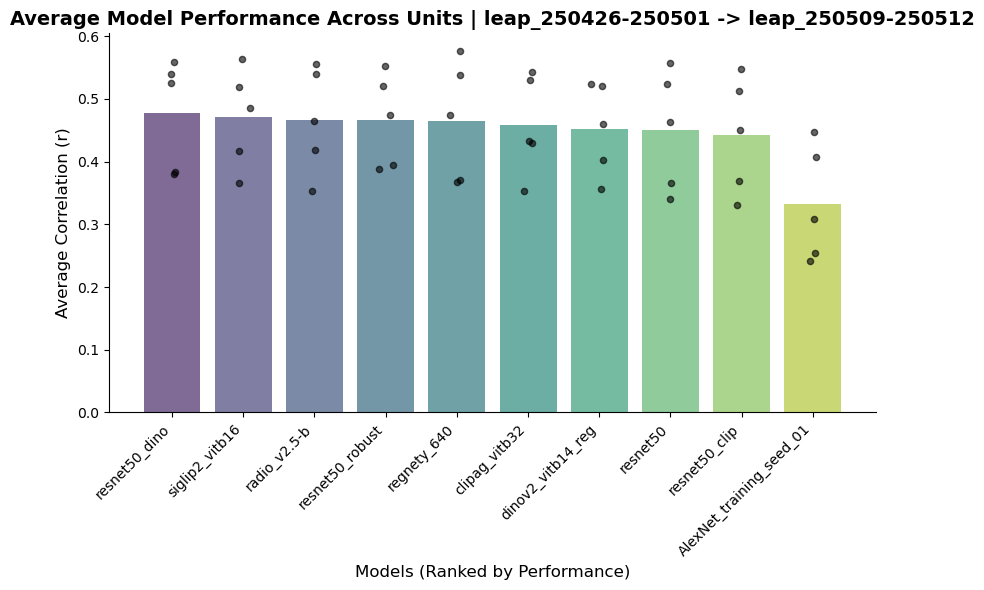

Model Rankings (High to Low):
10. resnet50_dino: 0.477
9. siglip2_vitb16: 0.471
8. radio_v2.5-b: 0.466
7. resnet50_robust: 0.466
6. regnety_640: 0.465
5. clipag_vitb32: 0.458
4. dinov2_vitb14_reg: 0.452
3. resnet50: 0.450
2. resnet50_clip: 0.442
1. AlexNet_training_seed_01: 0.332


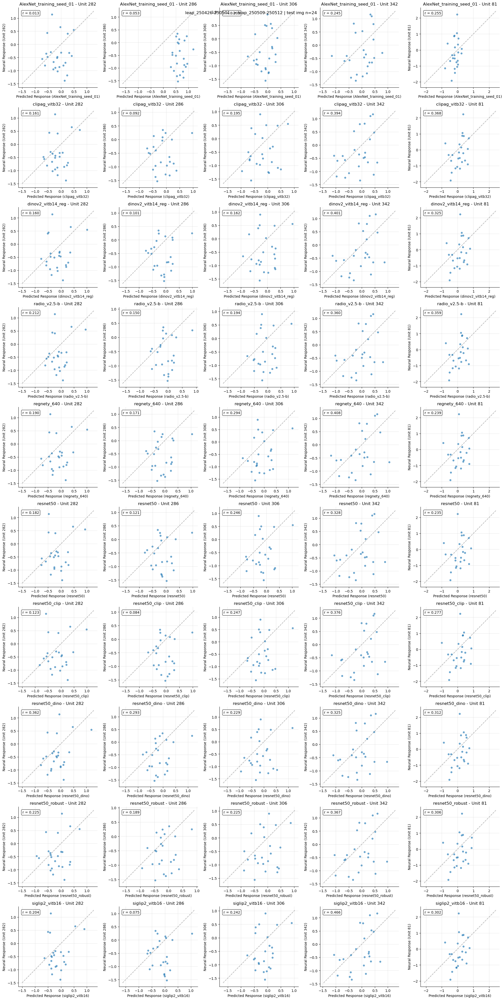

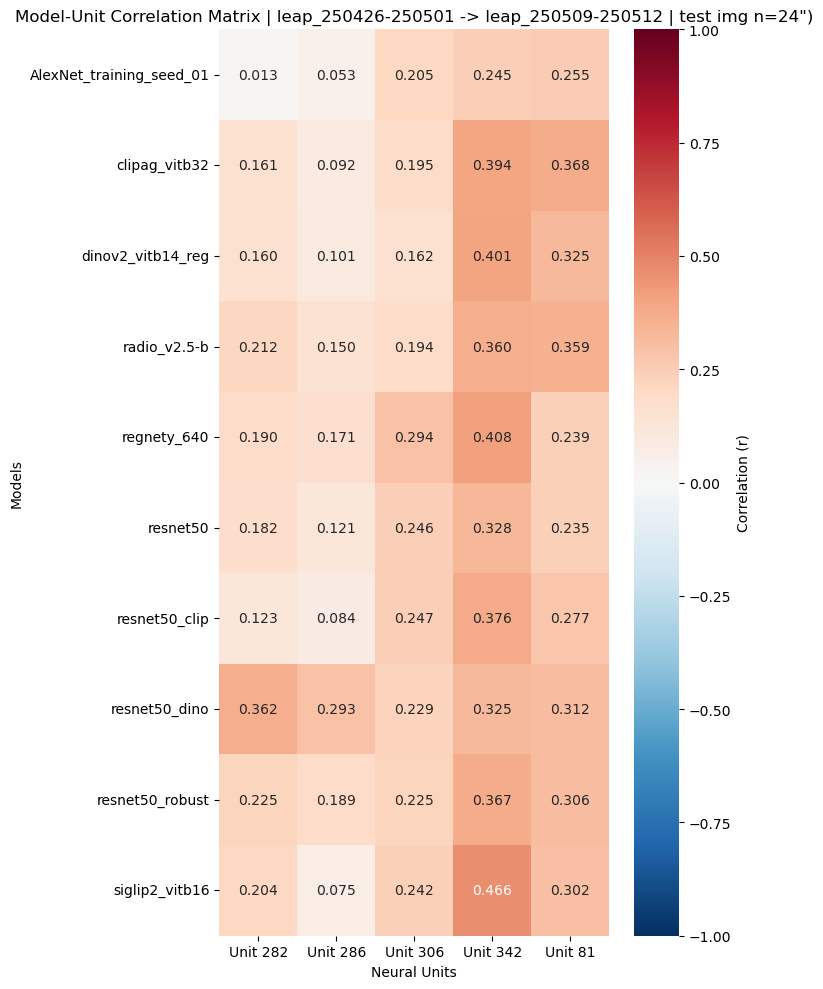

/tmp/ipykernel_183261/3203263593.py:136: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(data=df_model_corr, x='model', y='avg_correlation',


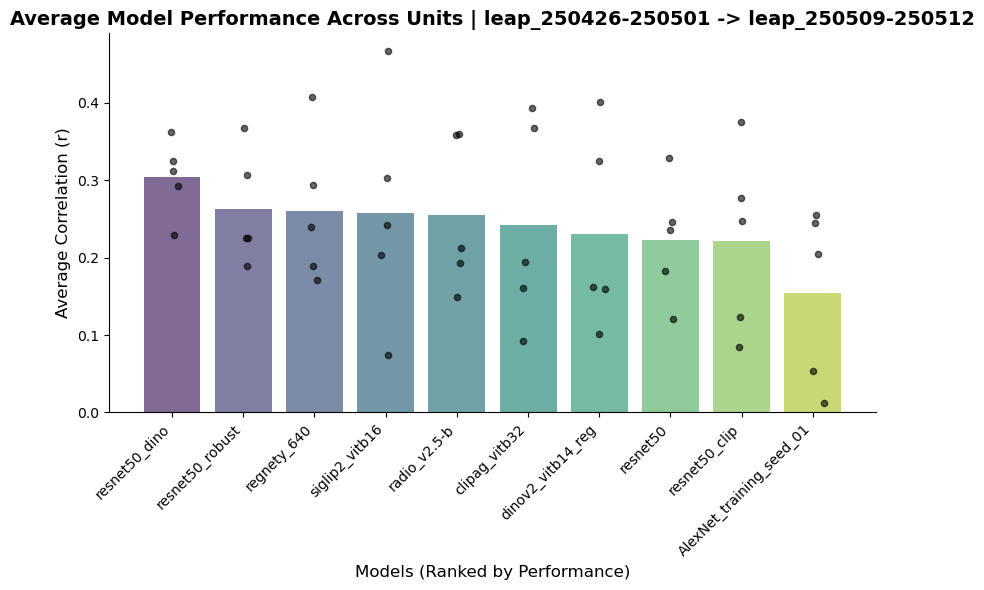

Model Rankings (High to Low):
10. resnet50_dino: 0.304
9. resnet50_robust: 0.263
8. regnety_640: 0.260
7. siglip2_vitb16: 0.258
6. radio_v2.5-b: 0.255
5. clipag_vitb32: 0.242
4. dinov2_vitb14_reg: 0.230
3. resnet50: 0.223
2. resnet50_clip: 0.221
1. AlexNet_training_seed_01: 0.154
respmat.shape (3057, 383)
stimnames.shape (3057,)
paired neural DNN resp df (46, 64)


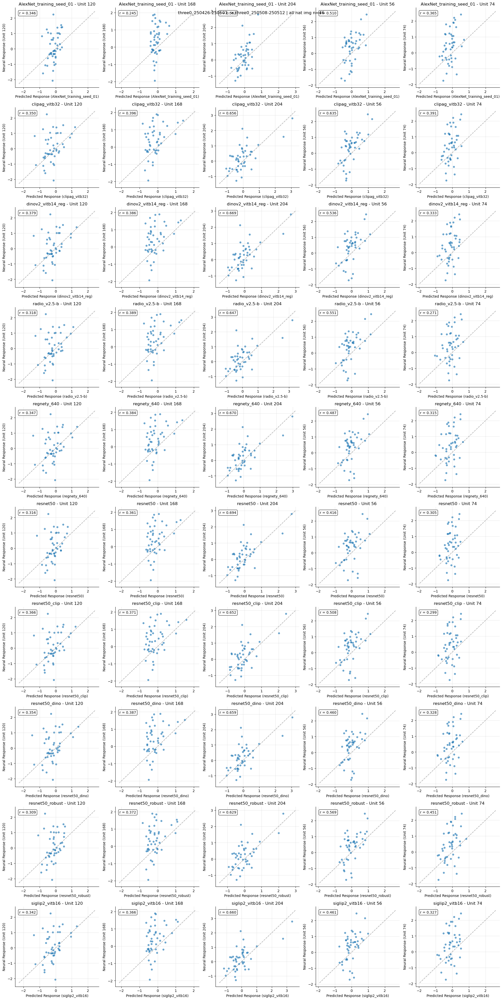

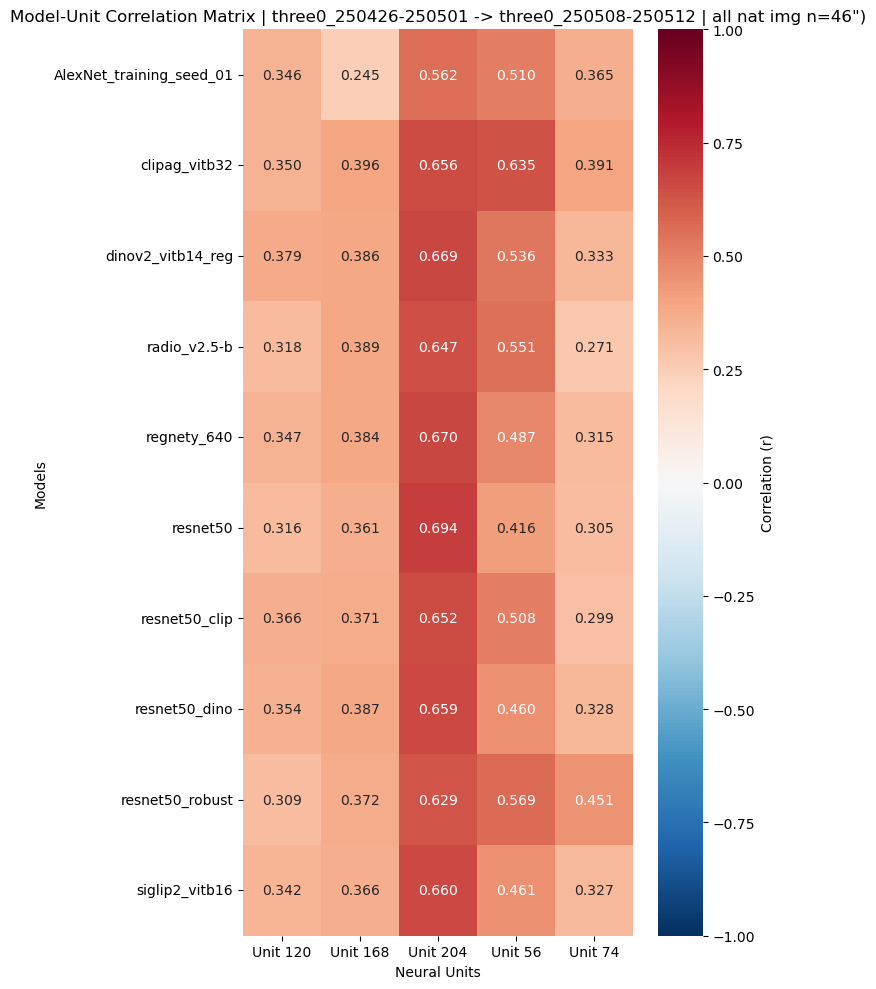

/tmp/ipykernel_183261/3203263593.py:136: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(data=df_model_corr, x='model', y='avg_correlation',


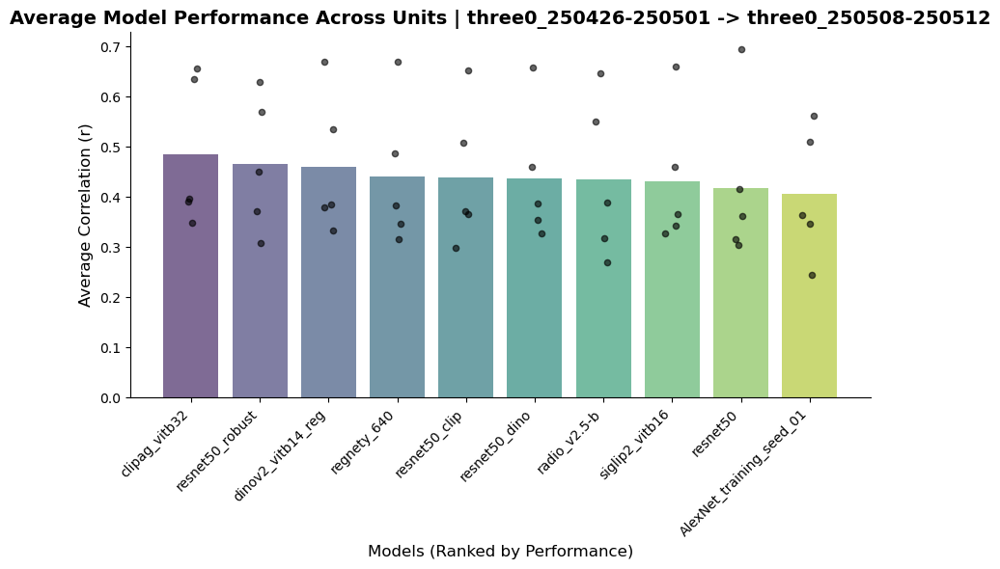

Model Rankings (High to Low):
10. clipag_vitb32: 0.486
9. resnet50_robust: 0.466
8. dinov2_vitb14_reg: 0.461
7. regnety_640: 0.440
6. resnet50_clip: 0.439
5. resnet50_dino: 0.438
4. radio_v2.5-b: 0.435
3. siglip2_vitb16: 0.431
2. resnet50: 0.419
1. AlexNet_training_seed_01: 0.406


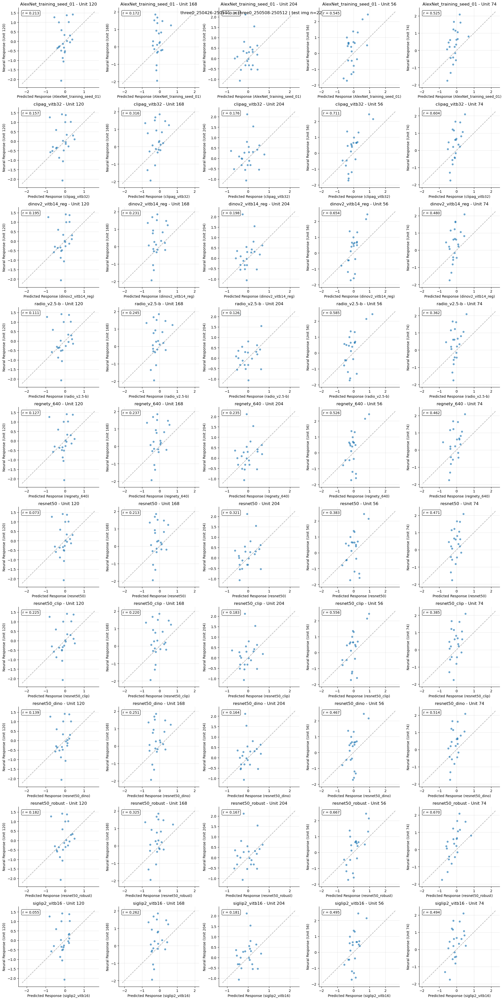

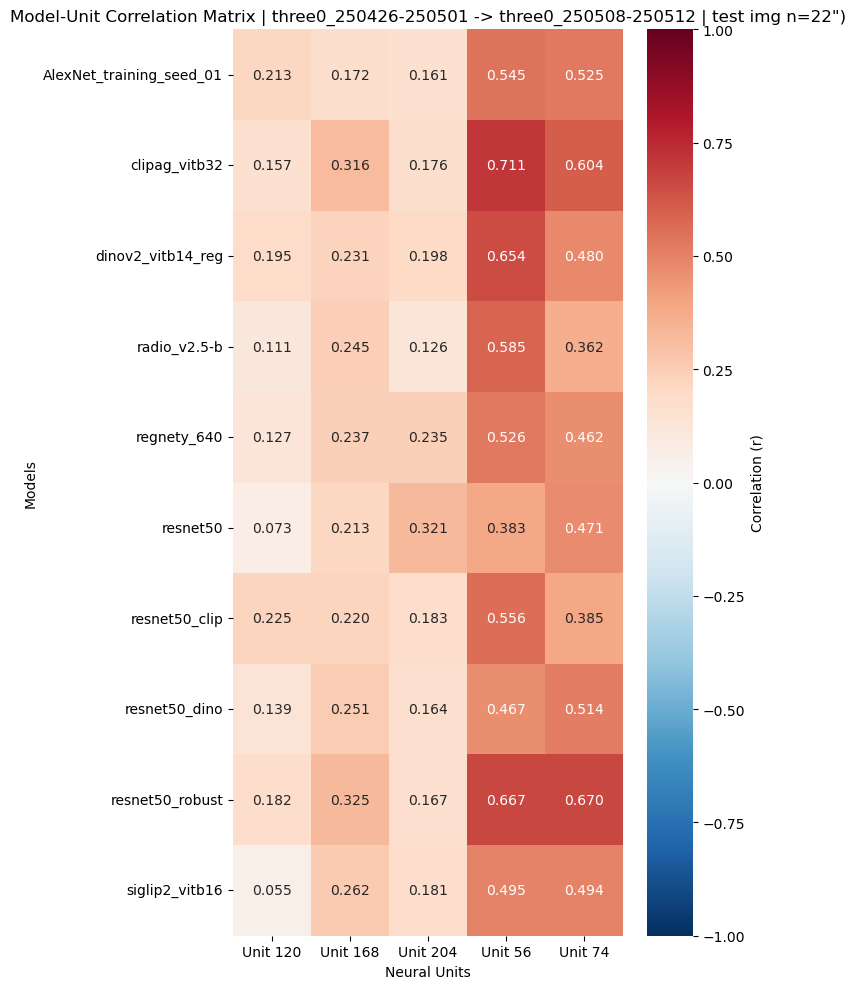

/tmp/ipykernel_183261/3203263593.py:136: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(data=df_model_corr, x='model', y='avg_correlation',


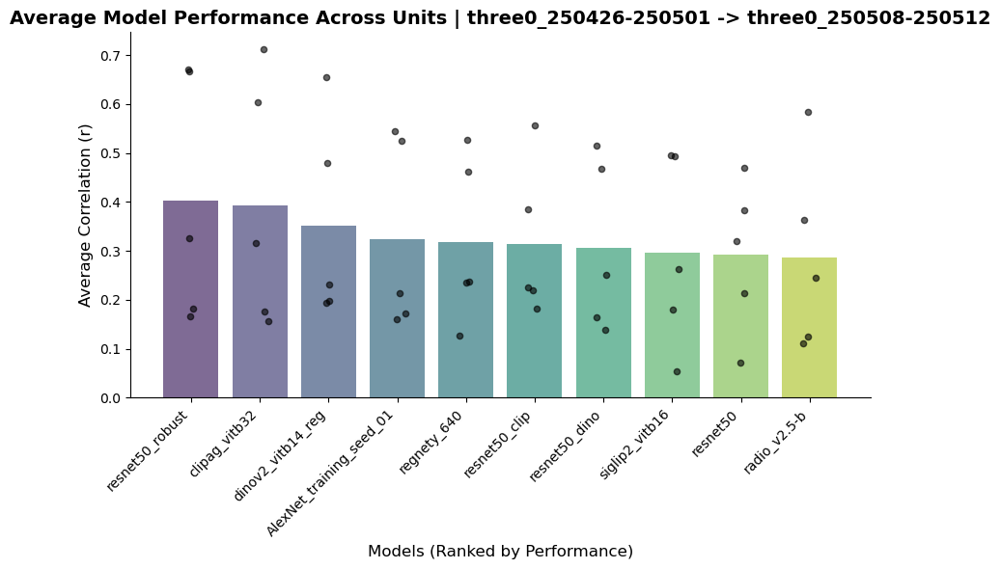

Model Rankings (High to Low):
10. resnet50_robust: 0.402
9. clipag_vitb32: 0.393
8. dinov2_vitb14_reg: 0.352
7. AlexNet_training_seed_01: 0.323
6. regnety_640: 0.317
5. resnet50_clip: 0.314
4. resnet50_dino: 0.307
3. siglip2_vitb16: 0.297
2. resnet50: 0.292
1. radio_v2.5-b: 0.286
respmat.shape (5595, 383)
stimnames.shape (5595,)
paired neural DNN resp df (100, 64)


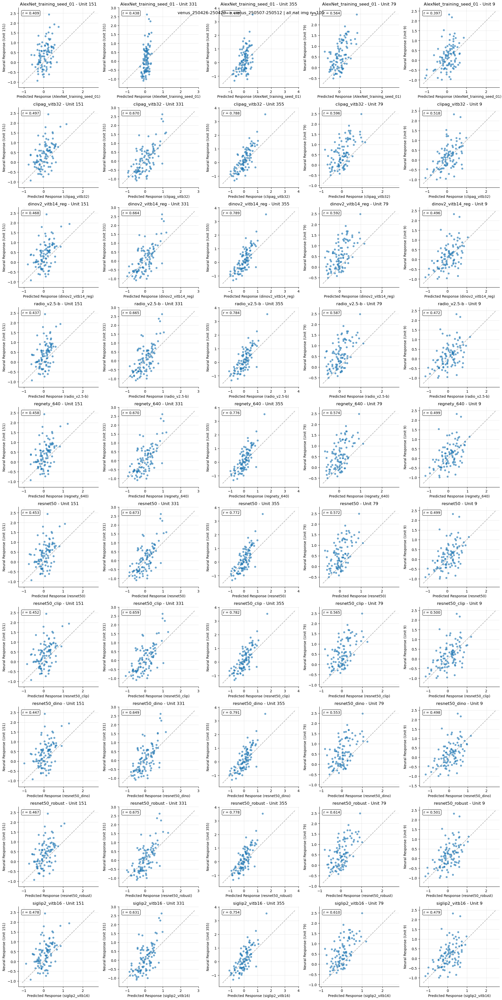

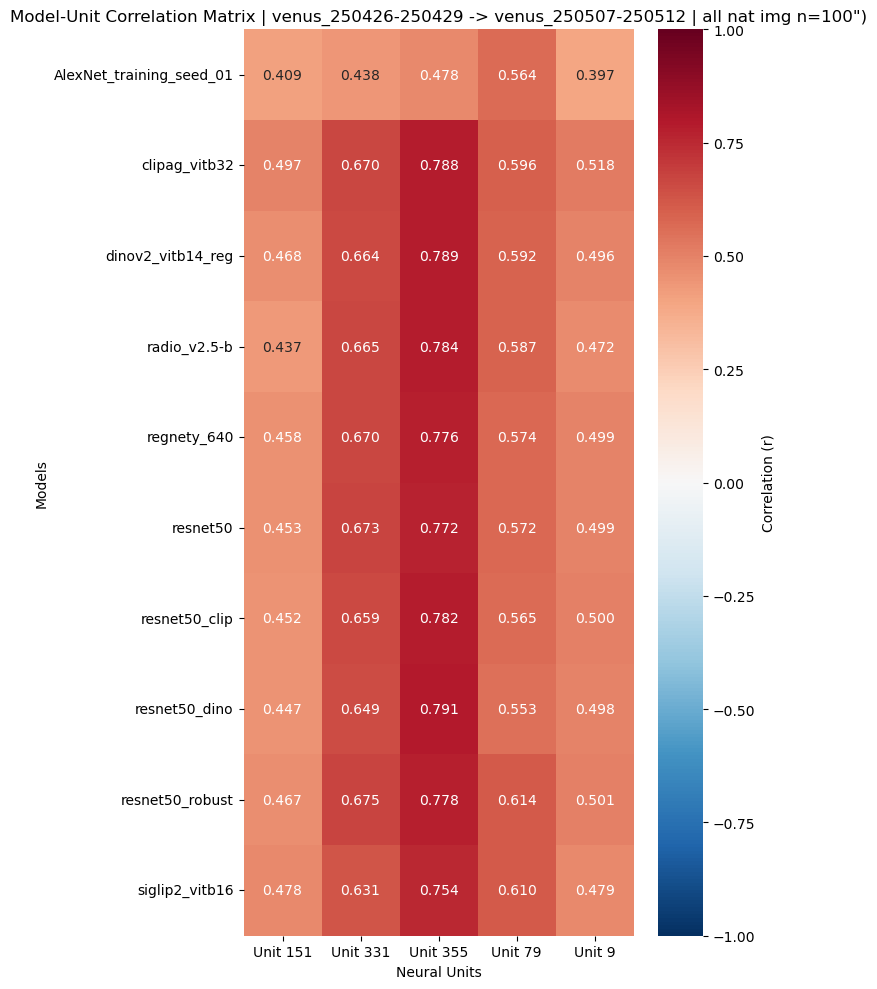

/tmp/ipykernel_183261/3203263593.py:136: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(data=df_model_corr, x='model', y='avg_correlation',


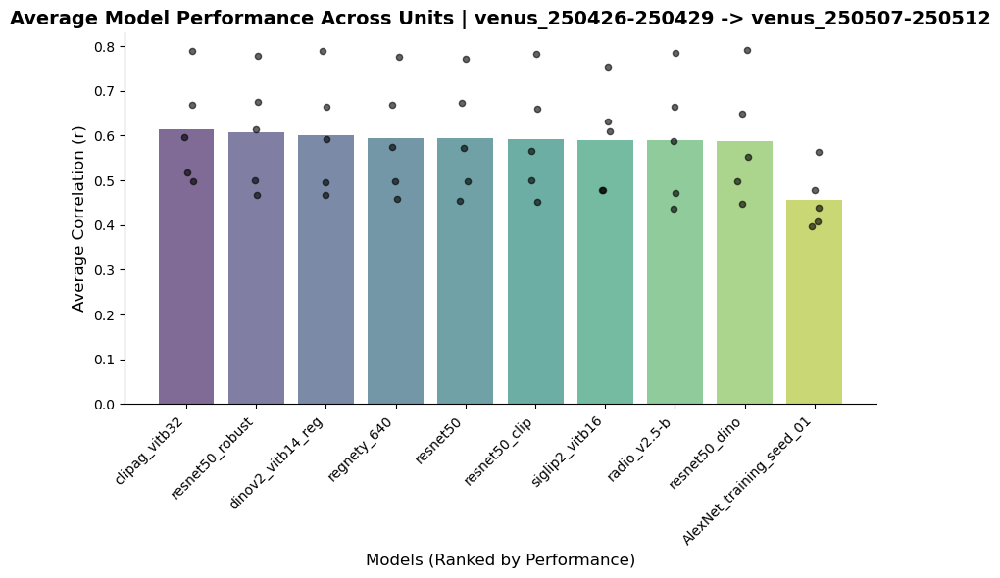

Model Rankings (High to Low):
10. clipag_vitb32: 0.614
9. resnet50_robust: 0.607
8. dinov2_vitb14_reg: 0.602
7. regnety_640: 0.595
6. resnet50: 0.594
5. resnet50_clip: 0.592
4. siglip2_vitb16: 0.590
3. radio_v2.5-b: 0.589
2. resnet50_dino: 0.588
1. AlexNet_training_seed_01: 0.457


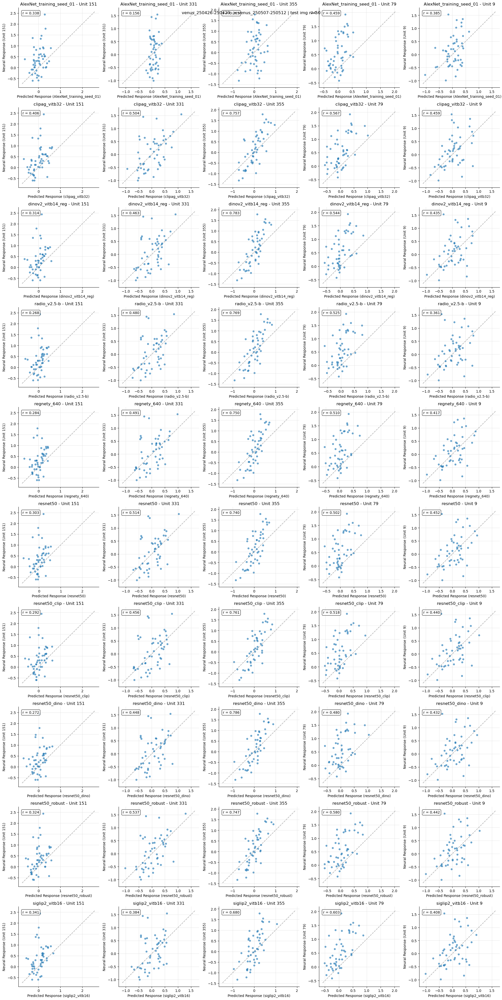

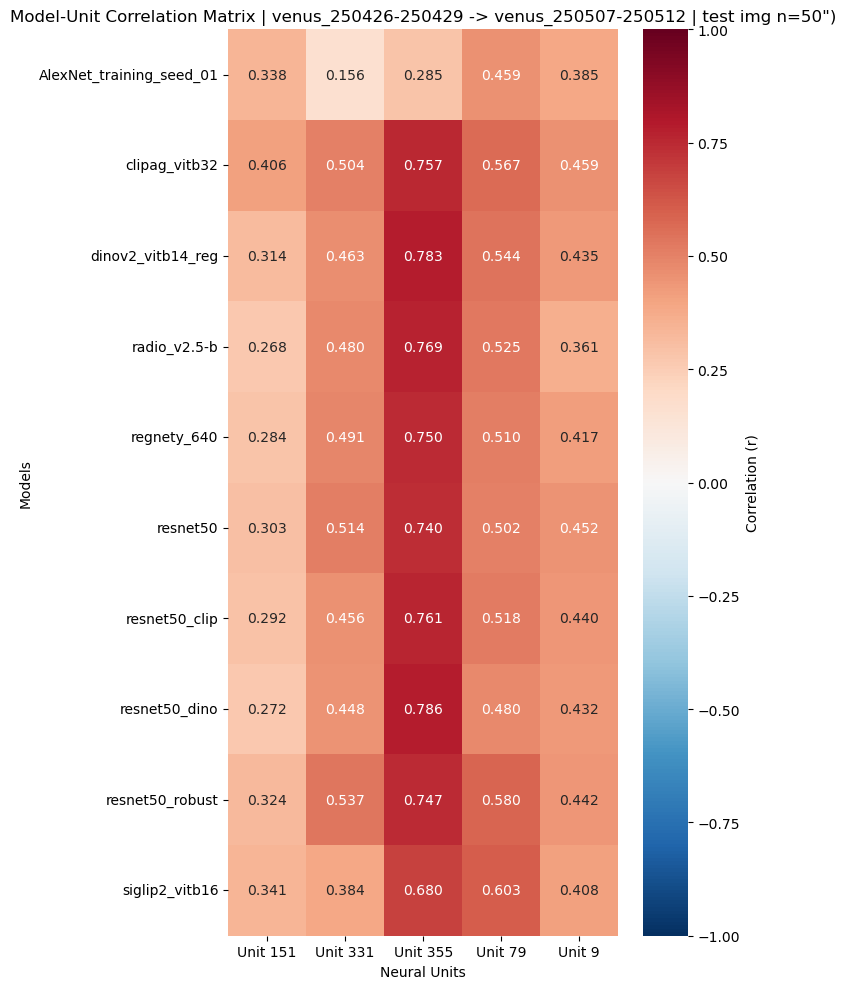

/tmp/ipykernel_183261/3203263593.py:136: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(data=df_model_corr, x='model', y='avg_correlation',


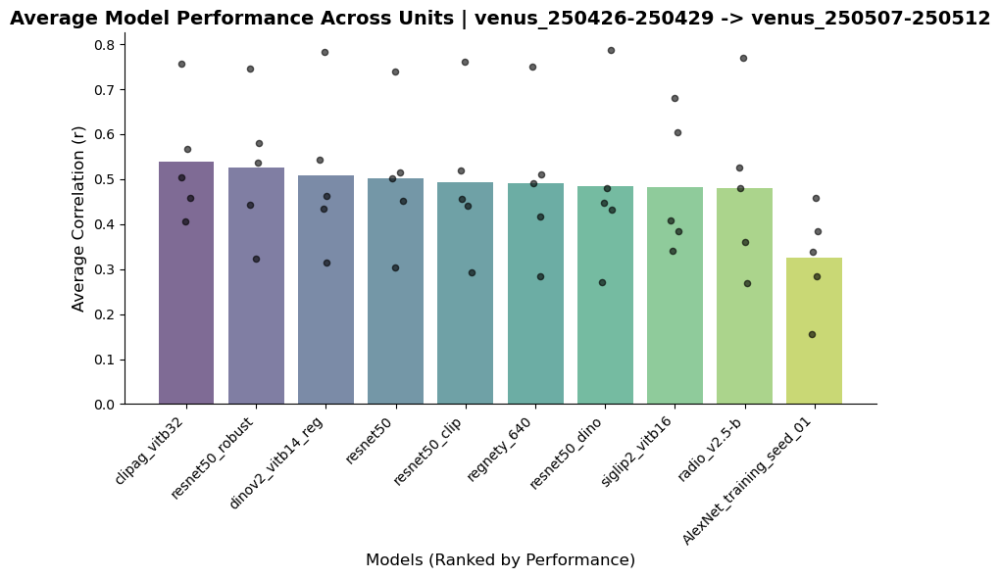

Model Rankings (High to Low):
10. clipag_vitb32: 0.539
9. resnet50_robust: 0.526
8. dinov2_vitb14_reg: 0.508
7. resnet50: 0.502
6. resnet50_clip: 0.494
5. regnety_640: 0.490
4. resnet50_dino: 0.484
3. siglip2_vitb16: 0.483
2. radio_v2.5-b: 0.481
1. AlexNet_training_seed_01: 0.325


In [98]:
# Encoding model subject IDs (training data) paired with test subject IDs (test data)
subject_pairs = [
    ("red_20250428-20250430", "red_20250504-20250512"),
    ("paul_20250428-20250430", "paul_20250505-20250512"),
    ("leap_250426-250501", "leap_250509-250512"),
    ("three0_250426-250501", "three0_250508-250512"),
    ("venus_250426-250429", "venus_250507-250512")
]
for enc_subj_id, test_subj_id in subject_pairs:
    
    posthoc_dir = f"/n/holylabs/LABS/alvarez_lab/Lab/VVS_Accentuation/Encoding_models/{enc_subj_id}/posthoc_model_predict"
    df_encoding_w_pred_resp = pd.read_pickle(join(posthoc_dir, f"encoding_stim_info_w_pred_resp_{enc_subj_id}.pkl"))
    df_encoding_w_pred_resp = convert_string_bools_to_bool(df_encoding_w_pred_resp)
    
    respmat = data[test_subj_id]["repavg"]['response_peak']
    stimnames = data[test_subj_id]["repavg"]["stimulus_name"]
    print("respmat.shape", respmat.shape)
    print("stimnames.shape", stimnames.shape)
    stimnames_str = [s.decode('utf-8') for s in stimnames]
    df_allstim = parse_accentuated_filenames_to_df(stimnames_str, include_parse_fail=True)
    # list of target units
    unit_list = df_allstim.unit_id.dropna().unique()
    df_allstim_w_neural_rsp = df_allstim.copy()
    for unit in unit_list:
        df_allstim_w_neural_rsp[f"neural_resp_unit_{unit}"] = respmat[:, unit]
    df_natimg_w_neural_rsp = df_allstim_w_neural_rsp.query("model_name.isna()")
    df_natimg_w_neural_rsp = df_natimg_w_neural_rsp.drop(columns=['model_name', 'unit_id', 'img_id', 'level', 'score'])
    df_natimg_neural_pred = df_natimg_w_neural_rsp.merge(df_encoding_w_pred_resp, left_on='filepath', right_on='stimulus_name', how='left')
    print("paired neural DNN resp df", df_natimg_neural_pred.shape)
    # Run the analysis
    df_model_corr, corr_matrix, (fig1, fig2, fig3) = analyze_model_performance(
        df_natimg_neural_pred, 
        unit_list, 
        subset_mask=None,
        subject_id=f"{enc_subj_id} -> {test_subj_id}",
        title_str=f"all nat img n={len(df_natimg_neural_pred)}"
    )
    df_model_corr, corr_matrix, (fig1, fig2, fig3) = analyze_model_performance(
        df_natimg_neural_pred, 
        unit_list, 
        subset_mask=~df_natimg_neural_pred.is_train, 
        subject_id=f"{enc_subj_id} -> {test_subj_id}",
        title_str=f"test img n={len(df_natimg_neural_pred.query('~ is_train'))}"
    )

In [ ]:


subject_ids = ["red_20250428-20250430",  "paul_20250428-20250430", "leap_250426-250501", "three0_250426-250501", "venus_250426-250429"]
subject_id = "red_20250428-20250430"
posthoc_dir = f"/n/holylabs/LABS/alvarez_lab/Lab/VVS_Accentuation/Encoding_models/{subject_id}/posthoc_model_predict"
df_encoding_w_pred_resp = pd.read_pickle(join(posthoc_dir, f"encoding_stim_info_w_pred_resp_{subject_id}.pkl"))
df_encoding_w_pred_resp = convert_string_bools_to_bool(df_encoding_w_pred_resp)